## Imports

In [1]:
import pathlib
import os
import os.path as osp
import sys
import argparse
parent_path = pathlib.Path(os.getcwd()).parent.absolute()
sys.path.append(str(parent_path))

import torch
import torch.nn.functional as F
from torch.nn import Linear
import torch_geometric.transforms as T
from torch_geometric.datasets import MovieLens
from torch_geometric.nn import SAGEConv, to_hetero

from utils.Neo4jMovieLensMetaData import Neo4jMovieLensMetaData
from utils.gnn_simple import Model
from utils.train_test import train_test
from utils.visualize import plot_loss, plot_train, plot_val, plot_test, plot_results

/Users/ioannisathanasiou/diploma/environ/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

#### Read the corresponsing csv, store the dataset to the DB, preprocess it, and get it as a pytorch graph object

In [3]:
path = osp.join(osp.dirname(osp.abspath('')), '../../data/MovieLensNeo4jMetaData')
dataset = Neo4jMovieLensMetaData(
    path,
    model_name='all-MiniLM-L6-v2',
    database_url="bolt://localhost:7687",
    database_username="neo4j",
    database_password="admin",
    force_pre_process=True,
    force_db_restore=False,
    text_features=["title", "original_title"],
    list_features=["genres"],
    # fastRP_features=["fastRP_embedding_genres_keywords"],
)
# path = osp.join(osp.dirname(osp.abspath('')), '../../data/MovieLens')
# dataset = MovieLens(path, model_name='all-MiniLM-L6-v2')
data = dataset[0].to(device)

Processing...


Encoding title...


Batches: 100%|██████████| 274/274 [00:07<00:00, 36.46it/s]


Encoding original_title...


Batches: 100%|██████████| 274/274 [00:09<00:00, 28.49it/s]


Encoding ['fastRP_embedding_companies_countries_languages', 'fastRP_embedding_genres_keywords']...
[torch.Size([8738, 384]), torch.Size([8738, 384]), torch.Size([8738, 32]), torch.Size([8738, 20])]


Done!


#### Preprocess the dataset

In [4]:
# Add user node features for message passing:
data['user'].x = torch.eye(data['user'].num_nodes, device=device)
del data['user'].num_nodes

# Add a reverse ('movie', 'rev_rates', 'user') relation for message passing:
data = T.ToUndirected()(data)
del data['movie', 'rev_rates', 'user'].edge_label  # Remove "reverse" label.

# Perform a link-level split into training, validation, and test edges:
train_data, val_data, test_data = T.RandomLinkSplit(
    num_val=0.1,
    num_test=0.1,
    neg_sampling_ratio=0.0,
    edge_types=[('user', 'rates', 'movie')],
    rev_edge_types=[('movie', 'rev_rates', 'user')],
)(data)

#### Define and train-test the model

Epoch: 010, Loss: 6.8755, Train: 1.2980, Val: 1.3201, Test: 1.2819


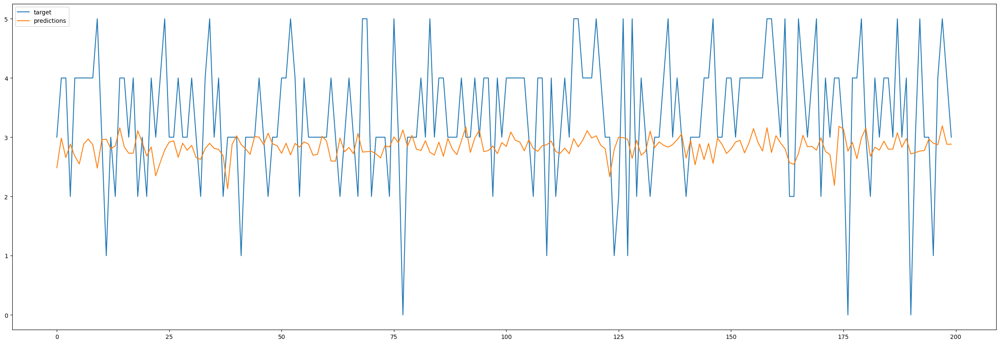

Epoch: 020, Loss: 6.5412, Train: 1.4513, Val: 1.4613, Test: 1.4396
Epoch: 030, Loss: 6.3772, Train: 1.6030, Val: 1.5757, Test: 1.5772


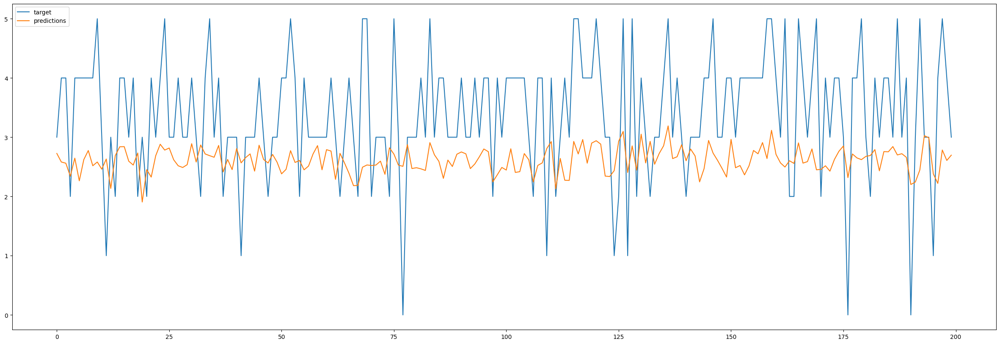

Epoch: 040, Loss: 6.0006, Train: 1.2916, Val: 1.2915, Test: 1.2700
Epoch: 050, Loss: 5.7491, Train: 1.3527, Val: 1.3607, Test: 1.3732


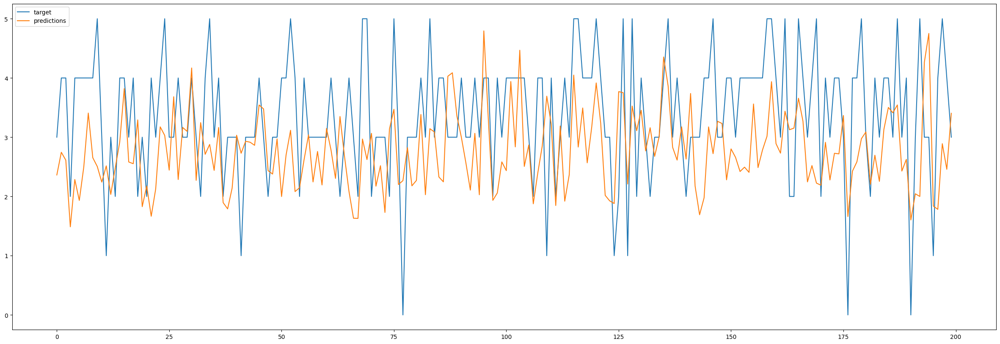

Epoch: 060, Loss: 5.3782, Train: 1.3263, Val: 1.3419, Test: 1.3288
Epoch: 070, Loss: 4.8868, Train: 1.2883, Val: 1.3158, Test: 1.2844


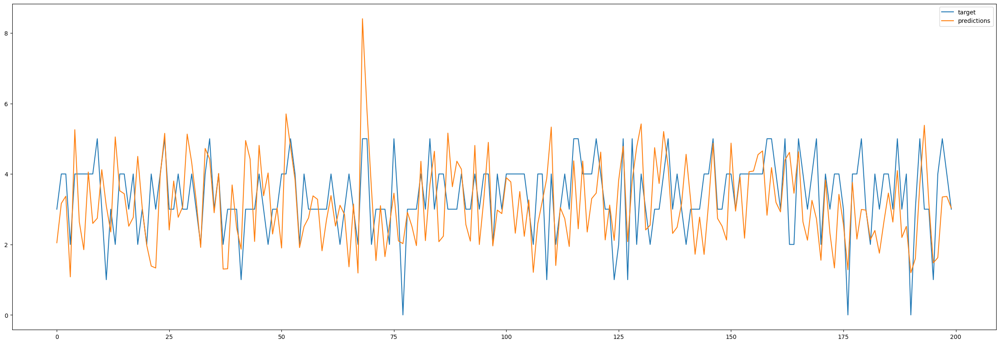

Epoch: 080, Loss: 4.5772, Train: 1.4353, Val: 1.4562, Test: 1.4462
Epoch: 090, Loss: 4.2451, Train: 1.2598, Val: 1.2519, Test: 1.2321


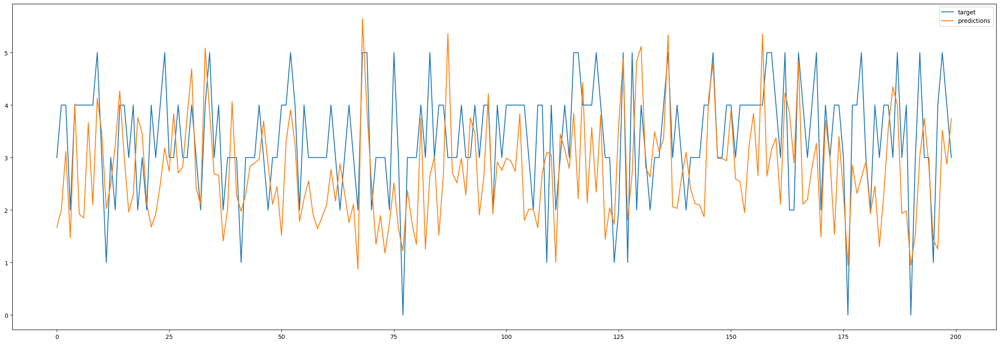

Epoch: 100, Loss: 4.1237, Train: 1.2421, Val: 1.2352, Test: 1.2421
Epoch: 110, Loss: 3.9516, Train: 1.2679, Val: 1.3058, Test: 1.2856


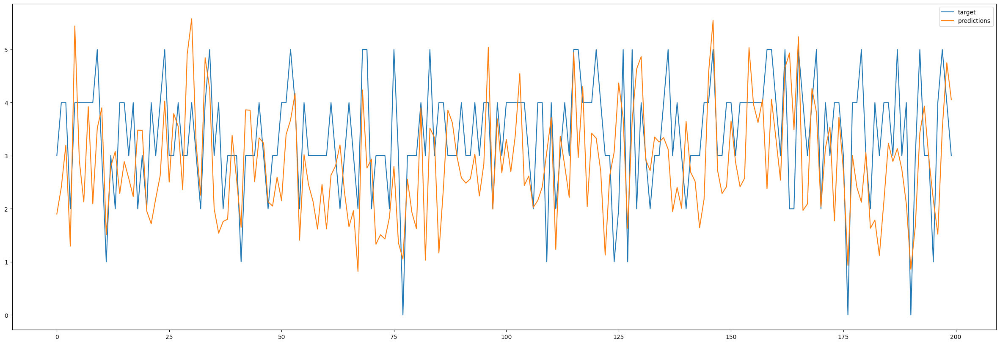

Epoch: 120, Loss: 3.9399, Train: 1.2499, Val: 1.2891, Test: 1.2664
Epoch: 130, Loss: 3.7929, Train: 1.2256, Val: 1.2604, Test: 1.2658


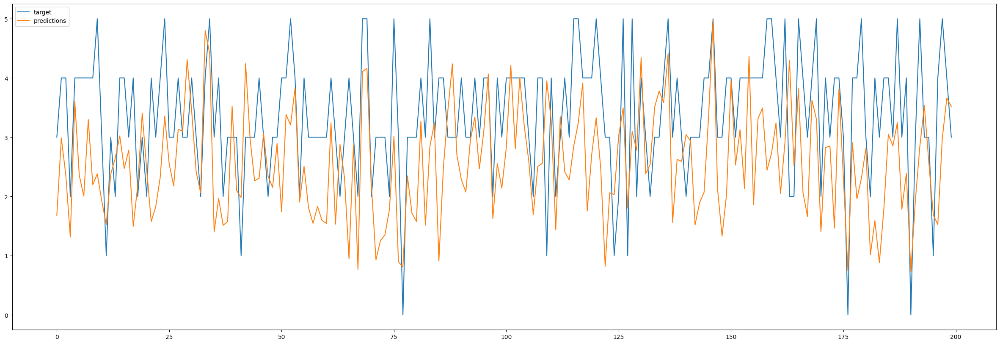

Epoch: 140, Loss: 3.9441, Train: 1.1138, Val: 1.1322, Test: 1.1375
Epoch: 150, Loss: 3.6712, Train: 1.1689, Val: 1.1840, Test: 1.1866


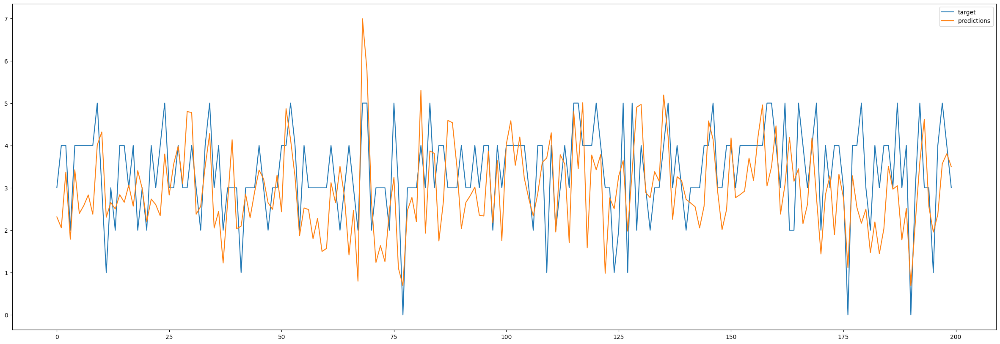

Epoch: 160, Loss: 3.4844, Train: 1.2287, Val: 1.2424, Test: 1.2227
Epoch: 170, Loss: 3.4285, Train: 1.1445, Val: 1.1711, Test: 1.1655


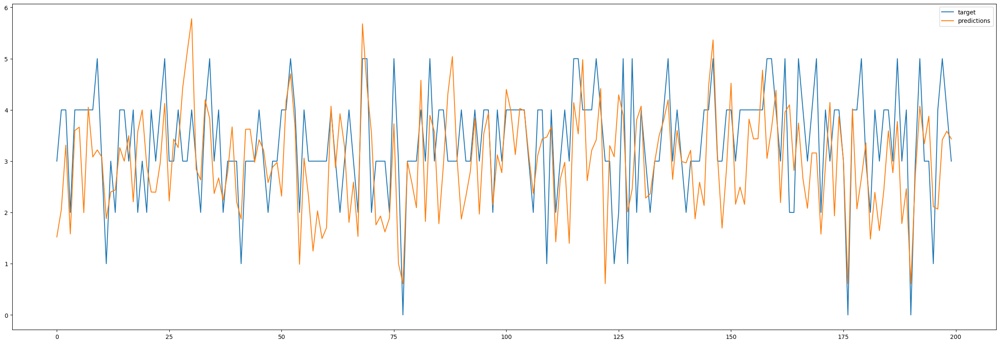

Epoch: 180, Loss: 3.3978, Train: 1.1446, Val: 1.1787, Test: 1.1613
Epoch: 190, Loss: 3.4351, Train: 1.2364, Val: 1.2731, Test: 1.2935


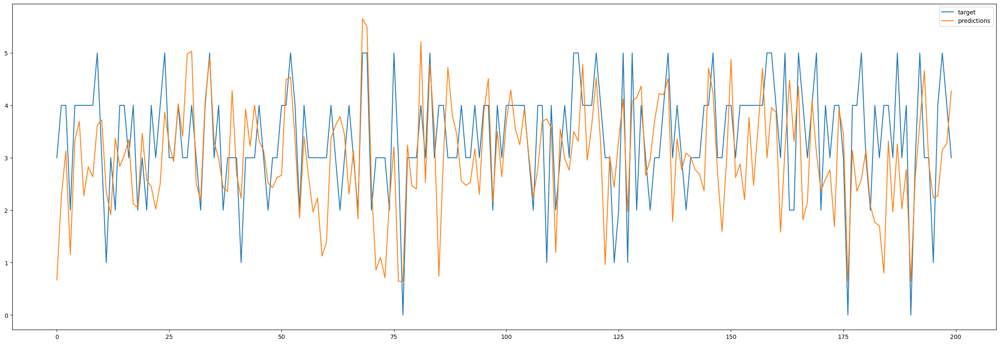

Epoch: 200, Loss: 3.2676, Train: 1.1699, Val: 1.2020, Test: 1.2037
Epoch: 210, Loss: 3.1517, Train: 1.0942, Val: 1.1402, Test: 1.1414


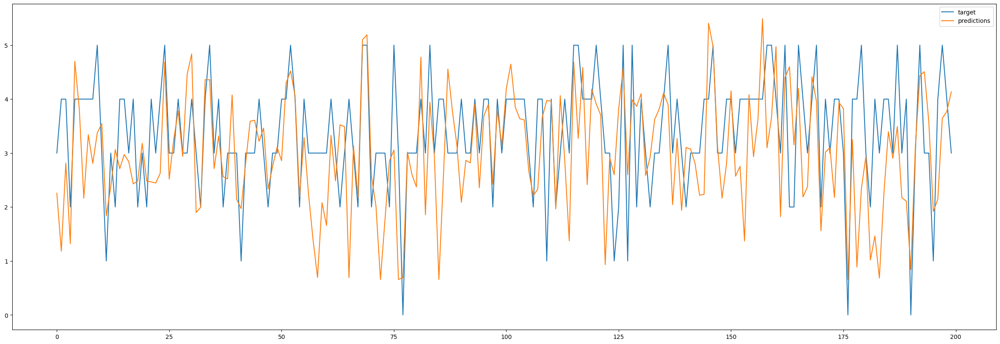

Epoch: 220, Loss: 3.0892, Train: 1.1438, Val: 1.2010, Test: 1.1978
Epoch: 230, Loss: 3.0502, Train: 1.0603, Val: 1.1086, Test: 1.0988


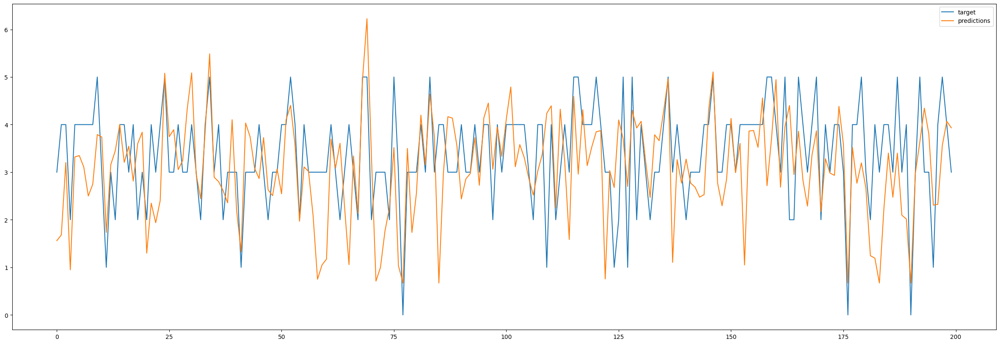

Epoch: 240, Loss: 3.0599, Train: 1.0619, Val: 1.1350, Test: 1.1261
Epoch: 250, Loss: 3.0617, Train: 1.0915, Val: 1.1358, Test: 1.1340


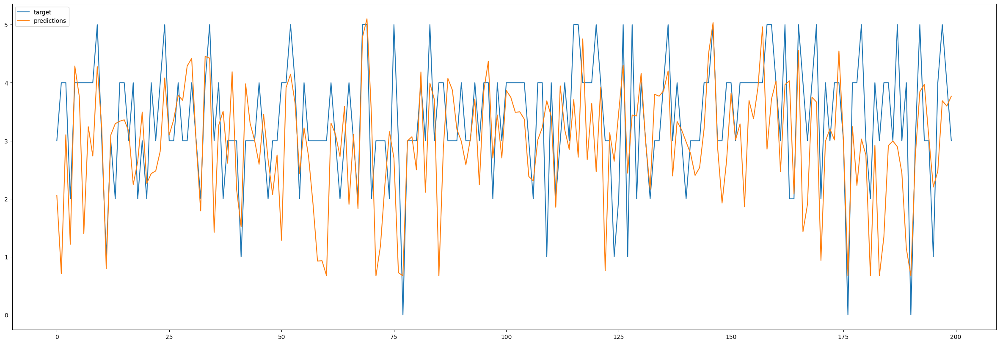

Epoch: 260, Loss: 2.9660, Train: 1.0748, Val: 1.1322, Test: 1.1183
Epoch: 270, Loss: 2.9453, Train: 1.0961, Val: 1.1598, Test: 1.1414


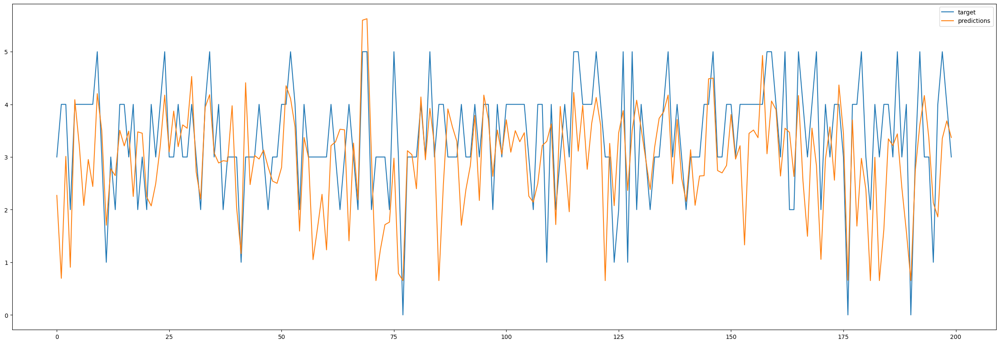

Epoch: 280, Loss: 2.9427, Train: 1.0935, Val: 1.1442, Test: 1.1307
Epoch: 290, Loss: 2.9122, Train: 1.0583, Val: 1.1220, Test: 1.0991


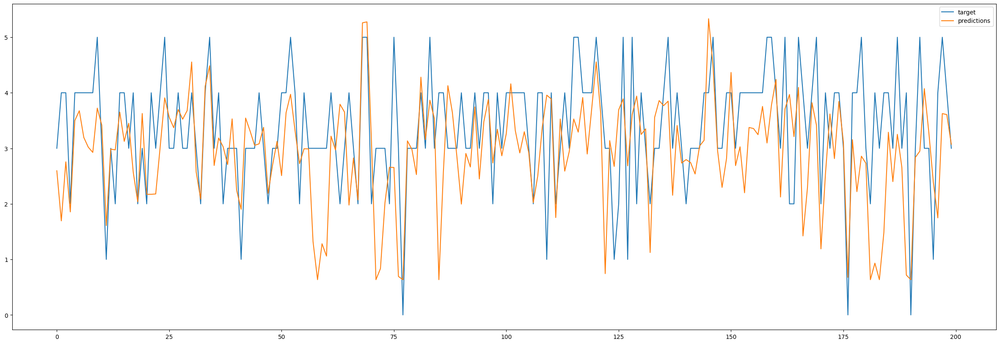

Epoch: 300, Loss: 2.8879, Train: 1.0376, Val: 1.0984, Test: 1.0978
Epoch: 310, Loss: 2.8709, Train: 1.1054, Val: 1.1816, Test: 1.1674


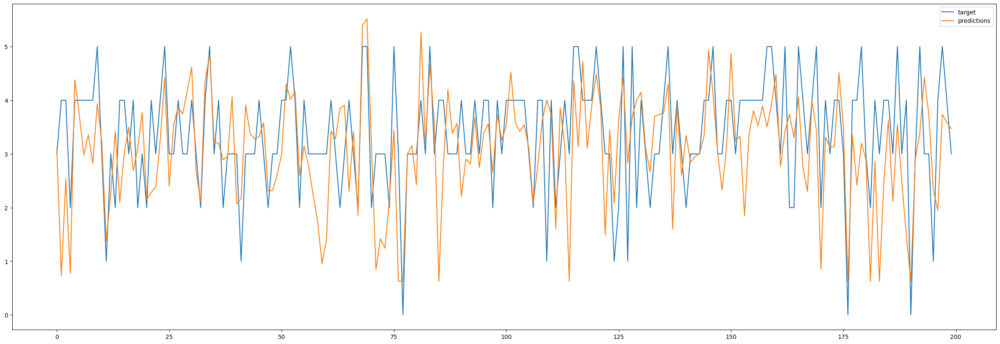

Epoch: 320, Loss: 2.8182, Train: 1.0843, Val: 1.1604, Test: 1.1356
Epoch: 330, Loss: 2.8435, Train: 1.0678, Val: 1.1467, Test: 1.1416


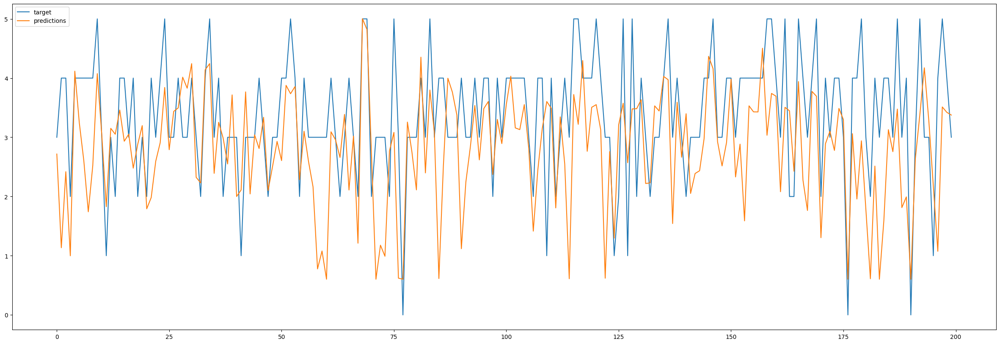

Epoch: 340, Loss: 2.9335, Train: 1.0617, Val: 1.1383, Test: 1.1238
Epoch: 350, Loss: 2.9704, Train: 1.0461, Val: 1.1238, Test: 1.1087


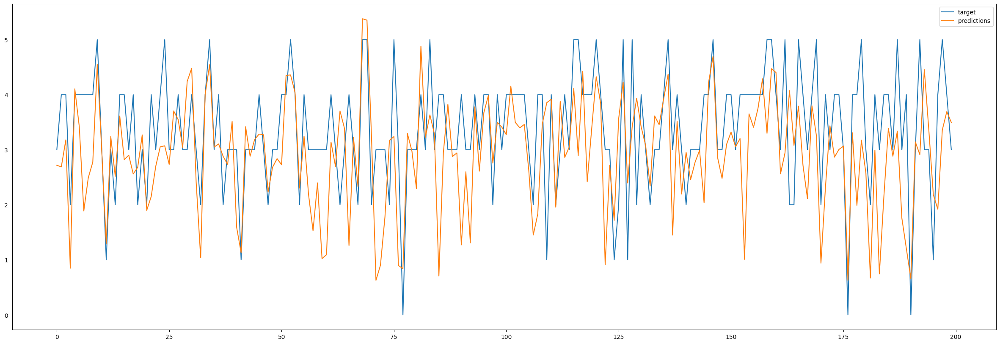

Epoch: 360, Loss: 2.8618, Train: 1.0991, Val: 1.1635, Test: 1.1605
Epoch: 370, Loss: 2.7891, Train: 1.1128, Val: 1.1983, Test: 1.1742


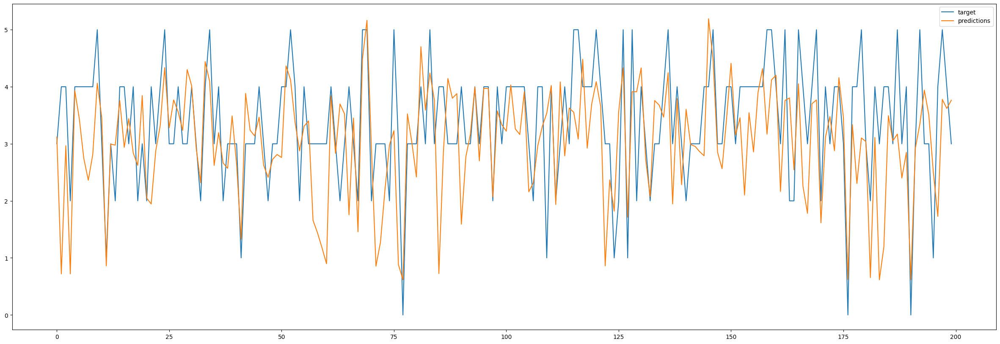

Epoch: 380, Loss: 2.7440, Train: 1.0780, Val: 1.1394, Test: 1.1266
Epoch: 390, Loss: 2.7495, Train: 1.0532, Val: 1.1265, Test: 1.1279


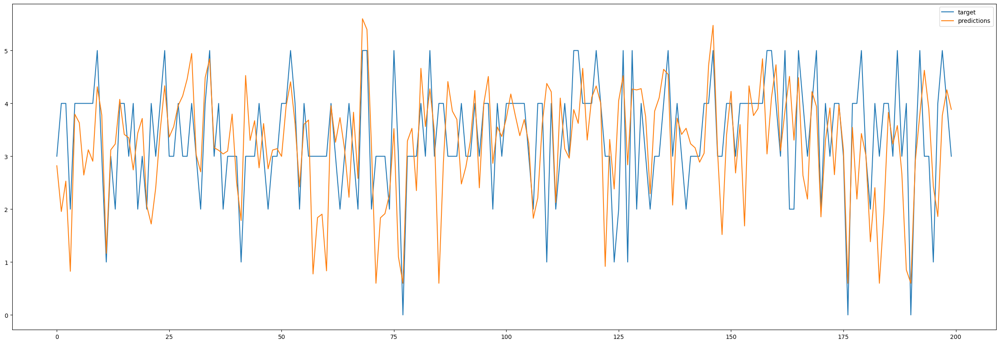

Epoch: 400, Loss: 2.7504, Train: 1.1244, Val: 1.1972, Test: 1.1788
Epoch: 410, Loss: 2.7053, Train: 1.1205, Val: 1.1865, Test: 1.1839


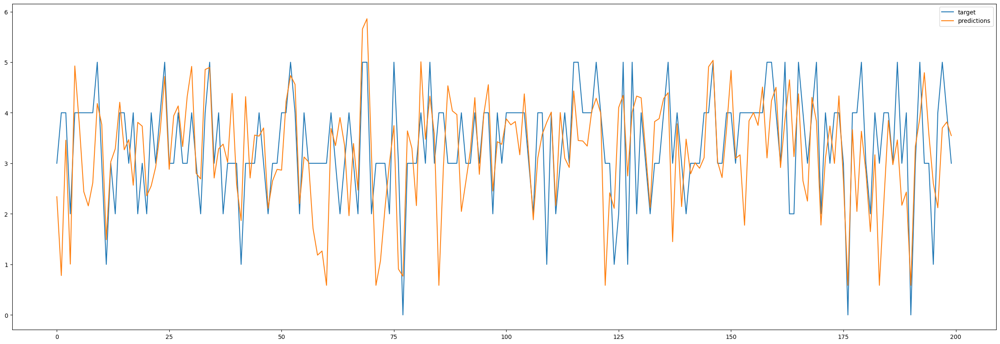

Epoch: 420, Loss: 2.7125, Train: 1.1104, Val: 1.1919, Test: 1.1738
Epoch: 430, Loss: 2.6727, Train: 1.0702, Val: 1.1596, Test: 1.1389


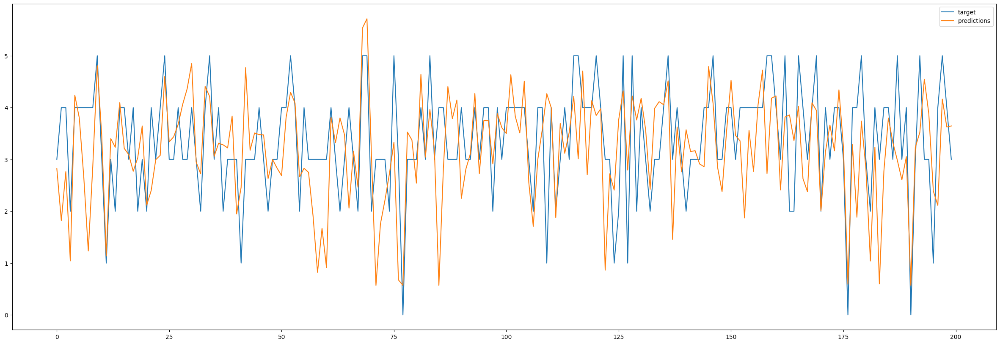

Epoch: 440, Loss: 2.6565, Train: 1.0626, Val: 1.1551, Test: 1.1273
Epoch: 450, Loss: 2.6762, Train: 1.0793, Val: 1.1605, Test: 1.1635


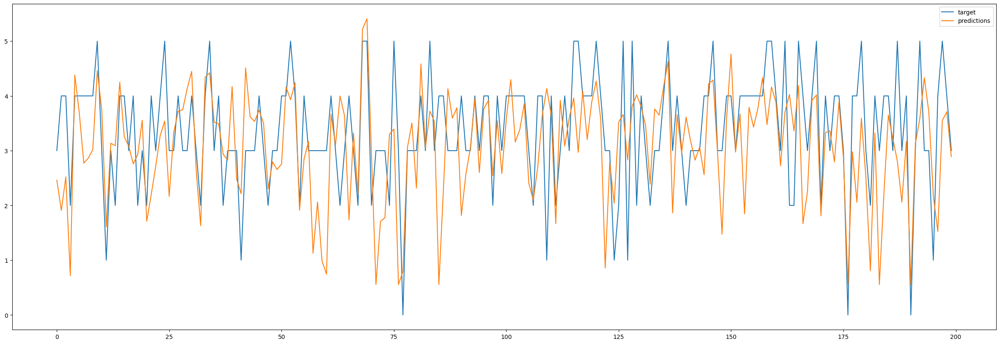

Epoch: 460, Loss: 2.6530, Train: 1.1081, Val: 1.1808, Test: 1.1701
Epoch: 470, Loss: 2.6383, Train: 1.0601, Val: 1.1451, Test: 1.1345


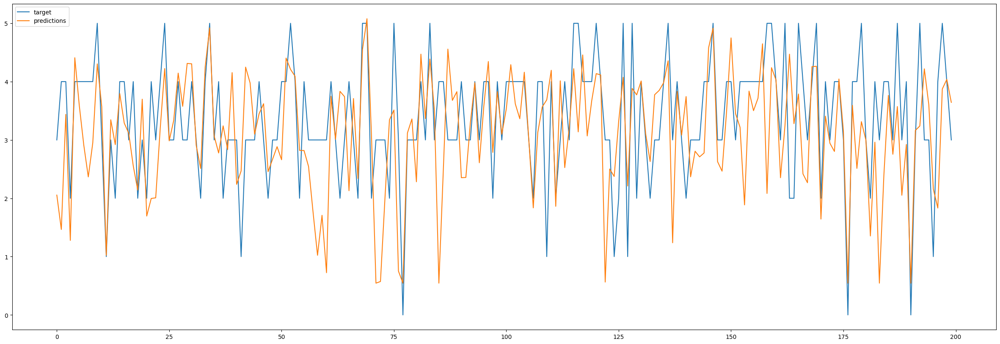

Epoch: 480, Loss: 2.6247, Train: 1.0770, Val: 1.1469, Test: 1.1379
Epoch: 490, Loss: 2.6243, Train: 1.0711, Val: 1.1598, Test: 1.1408


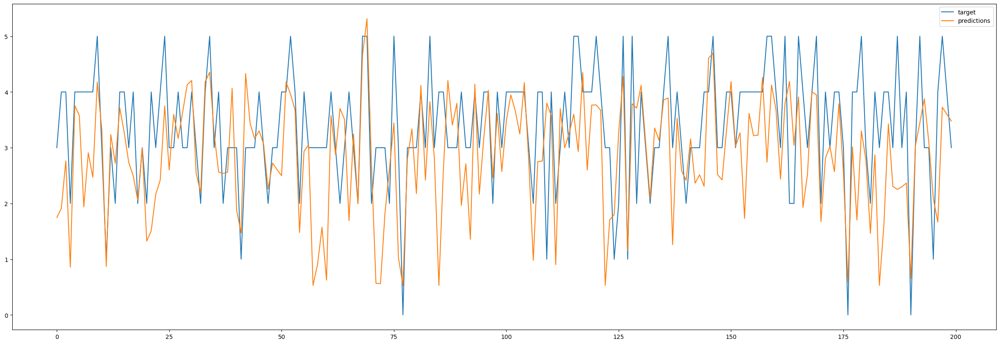

Epoch: 500, Loss: 2.7326, Train: 1.0771, Val: 1.1604, Test: 1.1550
Epoch: 510, Loss: 2.7370, Train: 0.9972, Val: 1.0729, Test: 1.0653


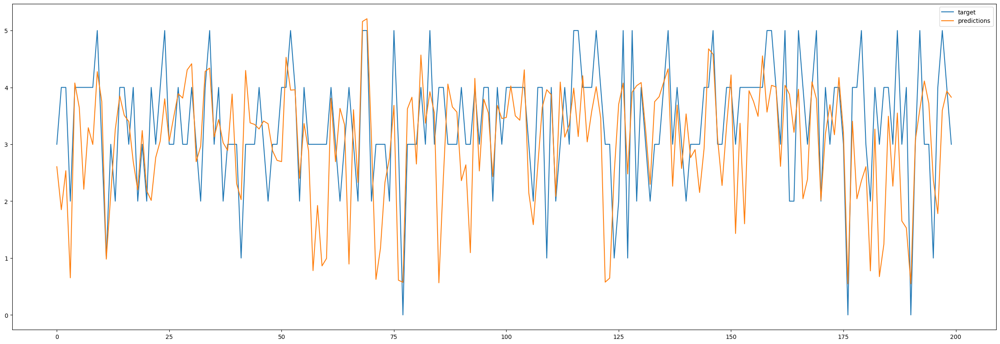

Epoch: 520, Loss: 2.6650, Train: 1.0115, Val: 1.1011, Test: 1.0830
Epoch: 530, Loss: 2.6253, Train: 1.0485, Val: 1.1281, Test: 1.1288


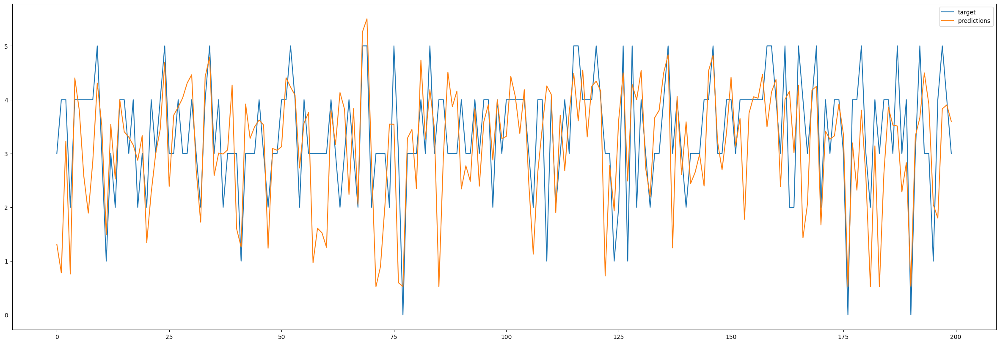

Epoch: 540, Loss: 2.6005, Train: 1.0882, Val: 1.1841, Test: 1.1596
Epoch: 550, Loss: 2.5800, Train: 1.0488, Val: 1.1257, Test: 1.1109


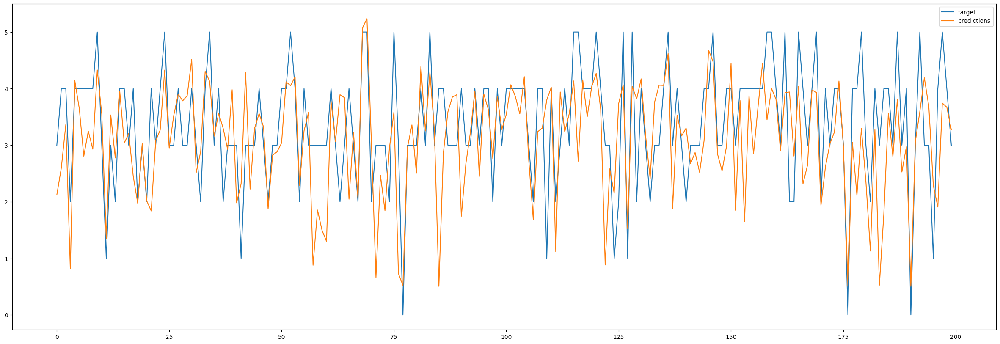

Epoch: 560, Loss: 2.5723, Train: 1.0198, Val: 1.1139, Test: 1.1079
Epoch: 570, Loss: 2.6036, Train: 1.0550, Val: 1.1568, Test: 1.1350


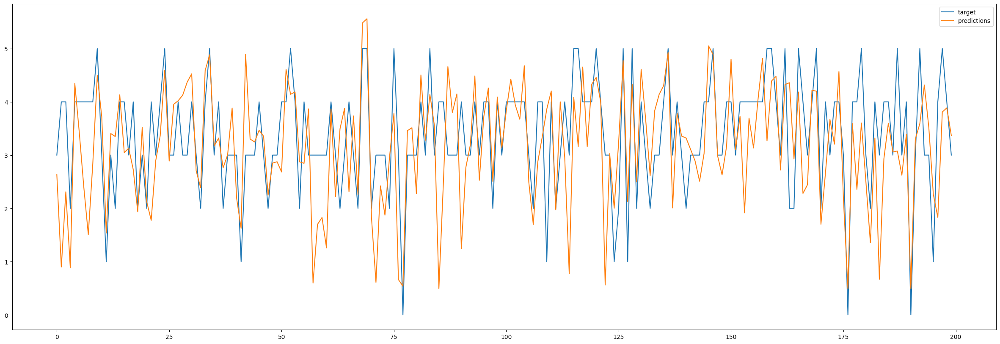

Epoch: 580, Loss: 2.5804, Train: 1.0458, Val: 1.1401, Test: 1.1100
Epoch: 590, Loss: 2.6602, Train: 1.1169, Val: 1.1999, Test: 1.1810


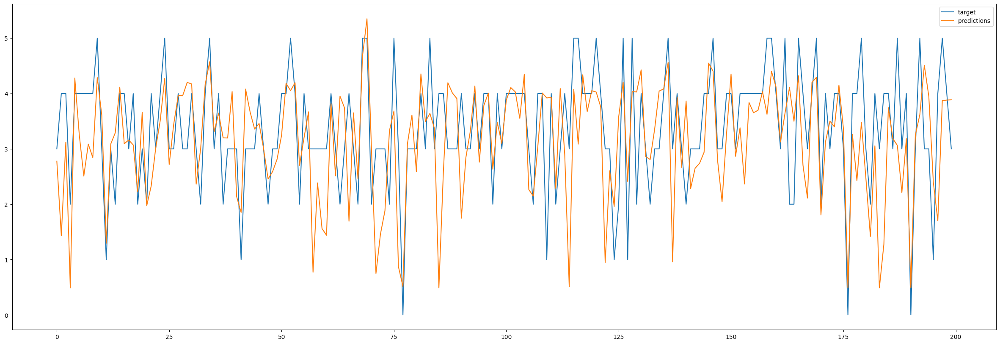

Epoch: 600, Loss: 2.5820, Train: 1.0878, Val: 1.1739, Test: 1.1537
Epoch: 610, Loss: 2.6006, Train: 1.0618, Val: 1.1616, Test: 1.1579


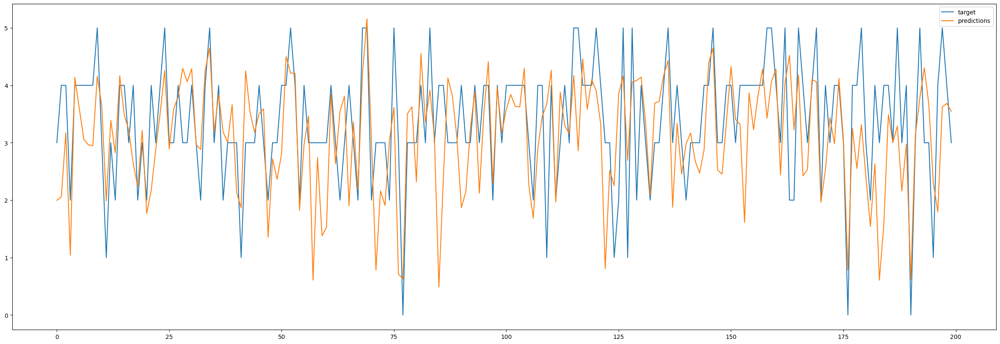

Epoch: 620, Loss: 2.5250, Train: 1.0478, Val: 1.1393, Test: 1.1144
Epoch: 630, Loss: 2.5830, Train: 1.0905, Val: 1.1982, Test: 1.1688


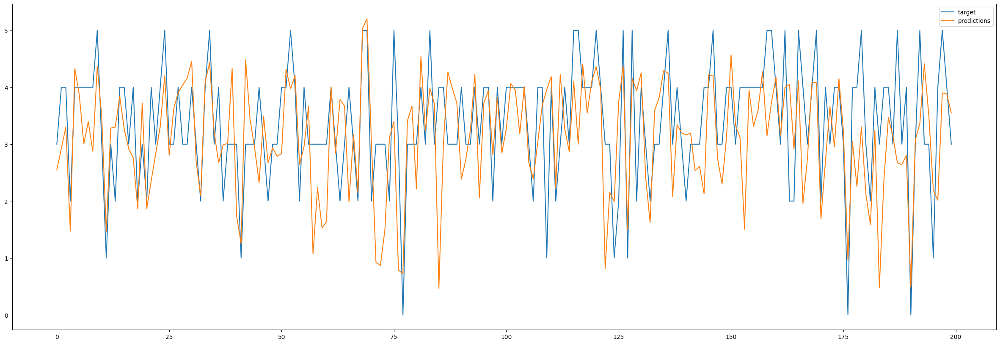

Epoch: 640, Loss: 2.5635, Train: 1.0552, Val: 1.1582, Test: 1.1438
Epoch: 650, Loss: 2.5766, Train: 1.0566, Val: 1.1639, Test: 1.1440


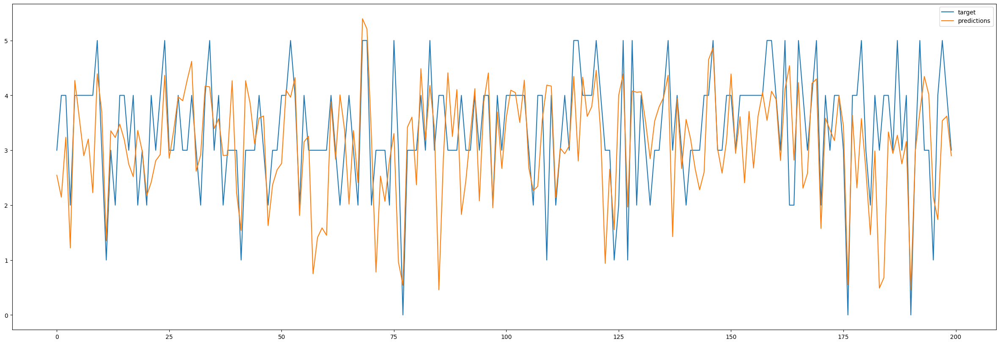

Epoch: 660, Loss: 2.5179, Train: 1.0470, Val: 1.1373, Test: 1.1286
Epoch: 670, Loss: 2.5106, Train: 1.0630, Val: 1.1657, Test: 1.1493


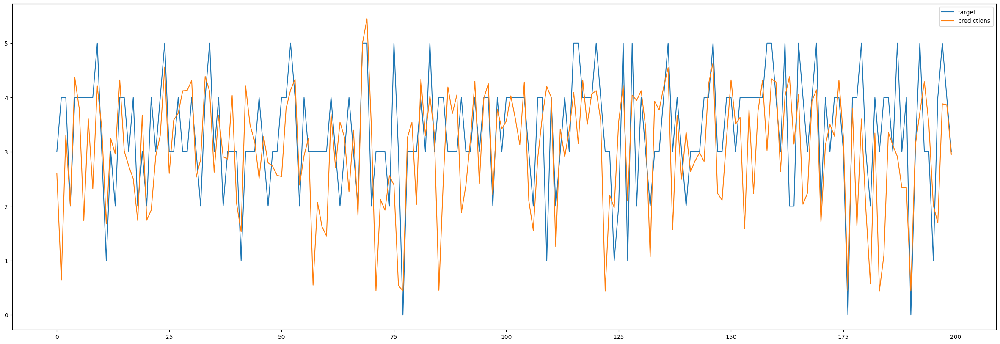

Epoch: 680, Loss: 2.5604, Train: 1.0055, Val: 1.1177, Test: 1.1061
Epoch: 690, Loss: 2.5526, Train: 1.0087, Val: 1.0915, Test: 1.0885


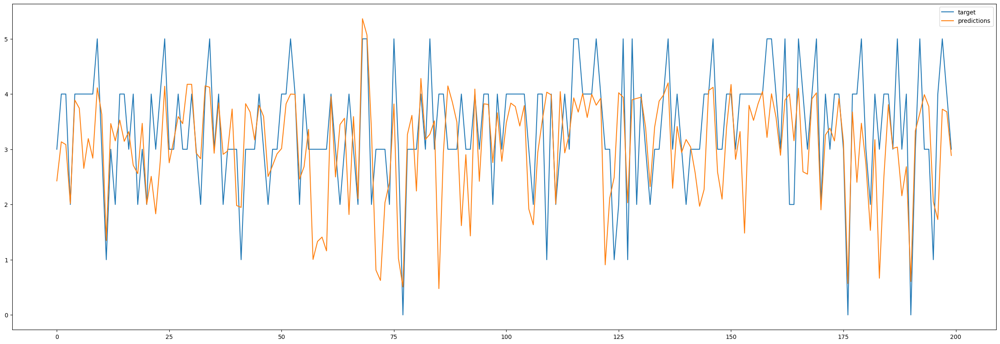

Epoch: 700, Loss: 2.5386, Train: 1.0453, Val: 1.1388, Test: 1.1309
Epoch: 710, Loss: 2.4864, Train: 1.0282, Val: 1.1271, Test: 1.1175


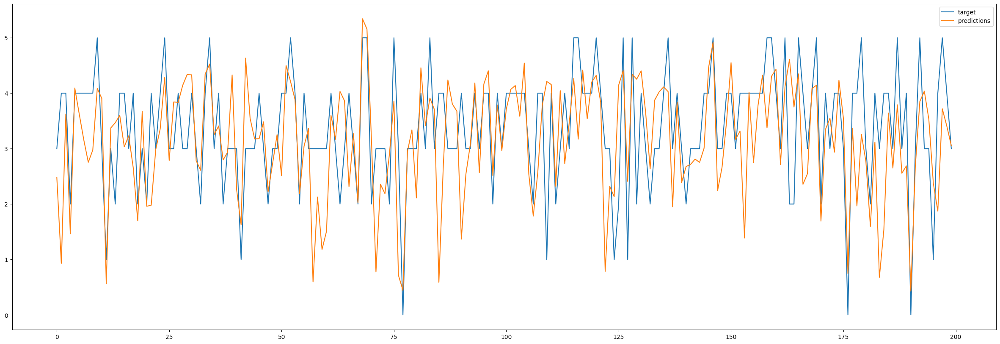

Epoch: 720, Loss: 2.4838, Train: 1.0467, Val: 1.1467, Test: 1.1218
Epoch: 730, Loss: 2.5457, Train: 1.0797, Val: 1.1691, Test: 1.1715


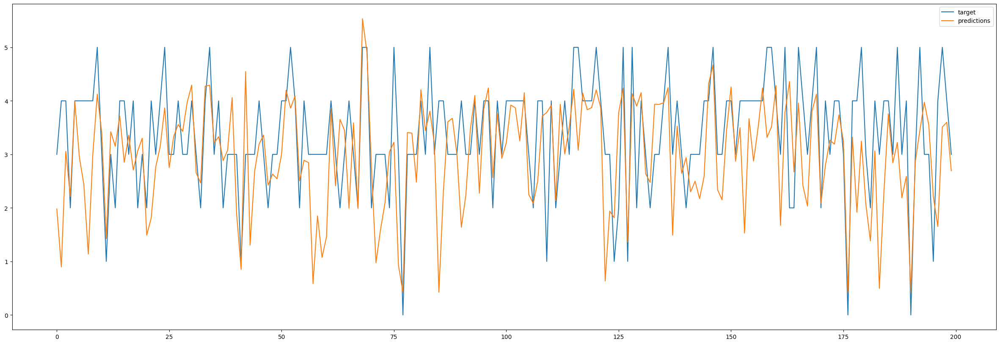

Epoch: 740, Loss: 2.5412, Train: 1.0703, Val: 1.1703, Test: 1.1495
Epoch: 750, Loss: 2.4818, Train: 1.0314, Val: 1.1261, Test: 1.1195


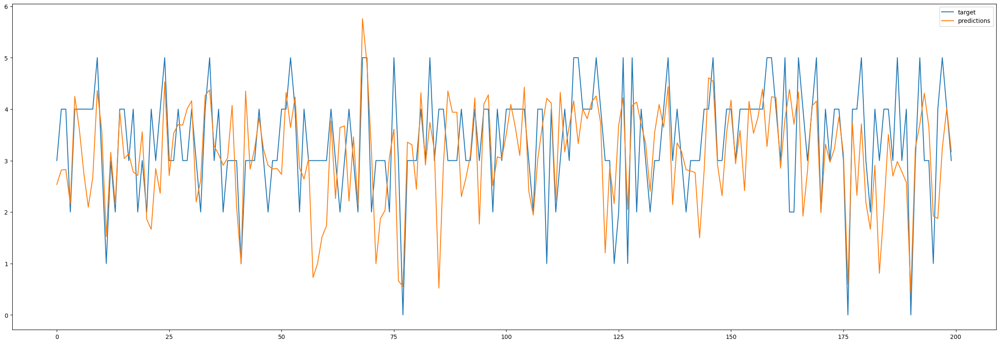

Epoch: 760, Loss: 2.4703, Train: 1.0366, Val: 1.1119, Test: 1.1278
Epoch: 770, Loss: 2.4855, Train: 1.0542, Val: 1.1571, Test: 1.1371


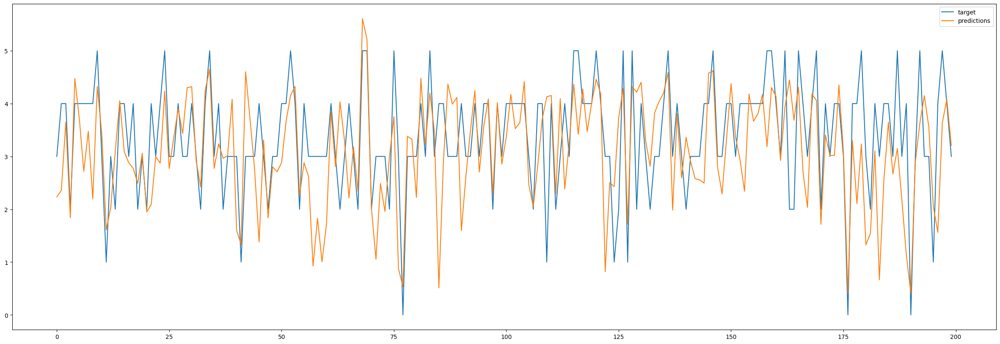

Epoch: 780, Loss: 2.4514, Train: 1.0506, Val: 1.1626, Test: 1.1336
Epoch: 790, Loss: 2.4790, Train: 1.0089, Val: 1.1082, Test: 1.1028


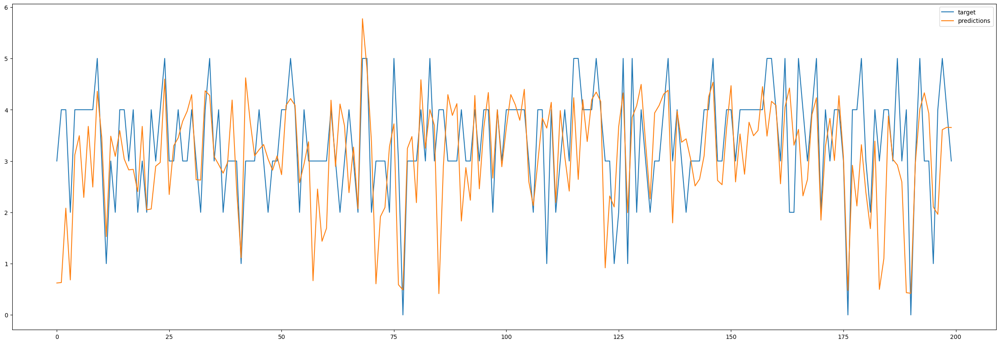

Epoch: 800, Loss: 2.4605, Train: 1.0143, Val: 1.1212, Test: 1.1080
Epoch: 810, Loss: 2.4729, Train: 1.0335, Val: 1.1328, Test: 1.1202


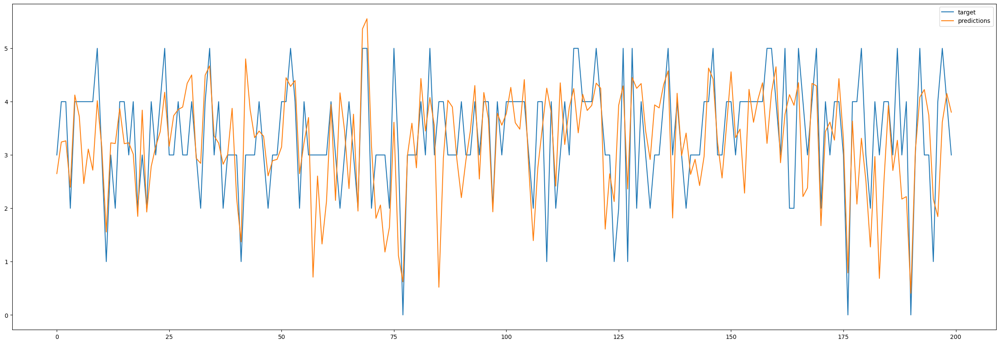

Epoch: 820, Loss: 2.5126, Train: 1.0398, Val: 1.1201, Test: 1.1316
Epoch: 830, Loss: 2.4436, Train: 1.0456, Val: 1.1472, Test: 1.1382


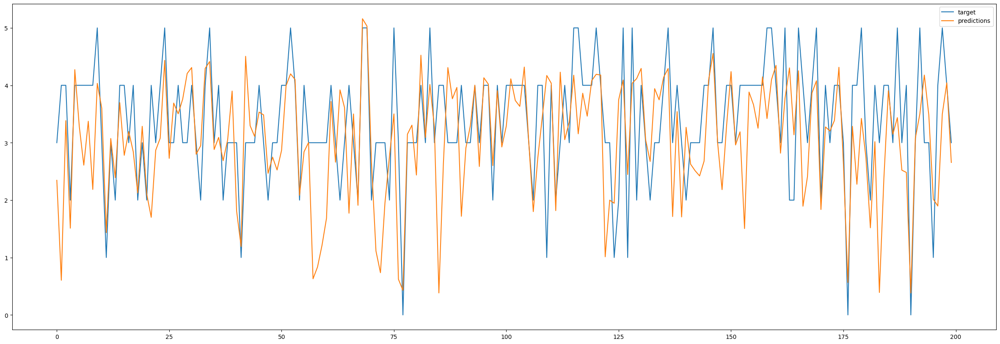

Epoch: 840, Loss: 2.4831, Train: 1.0130, Val: 1.1240, Test: 1.1157
Epoch: 850, Loss: 2.4636, Train: 1.0281, Val: 1.1330, Test: 1.1295


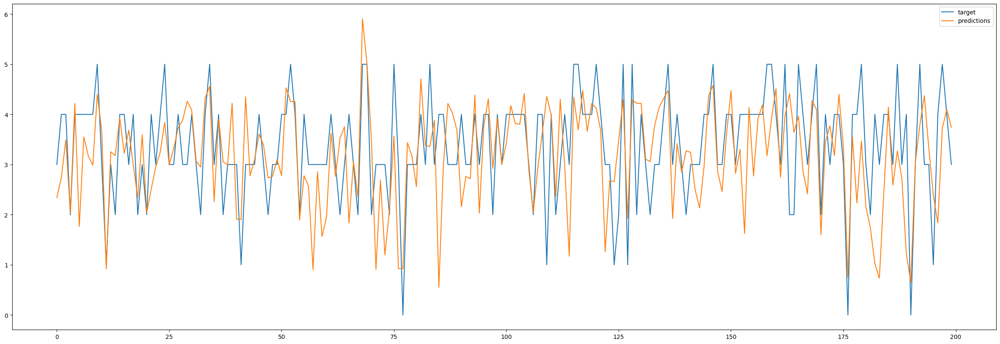

Epoch: 860, Loss: 2.5068, Train: 1.0581, Val: 1.1425, Test: 1.1375
Epoch: 870, Loss: 2.4437, Train: 1.0699, Val: 1.1804, Test: 1.1603


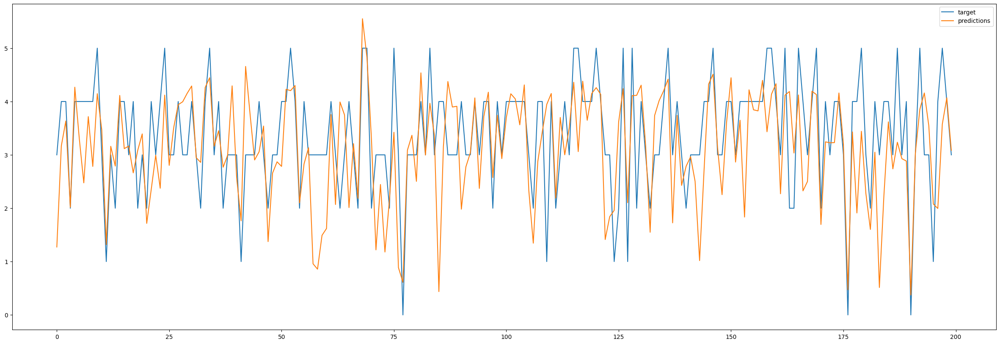

Epoch: 880, Loss: 2.4461, Train: 1.0272, Val: 1.1374, Test: 1.1125
Epoch: 890, Loss: 2.4562, Train: 1.0574, Val: 1.1564, Test: 1.1333


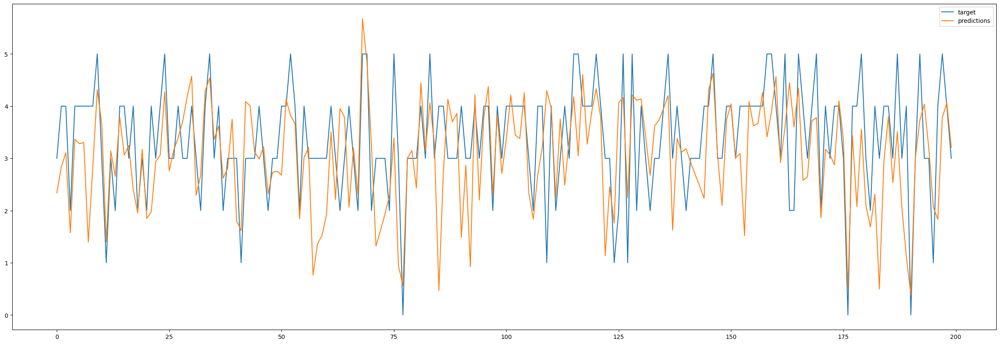

Epoch: 900, Loss: 2.4806, Train: 1.0241, Val: 1.1201, Test: 1.1110
Epoch: 910, Loss: 2.5107, Train: 1.0085, Val: 1.1006, Test: 1.1022


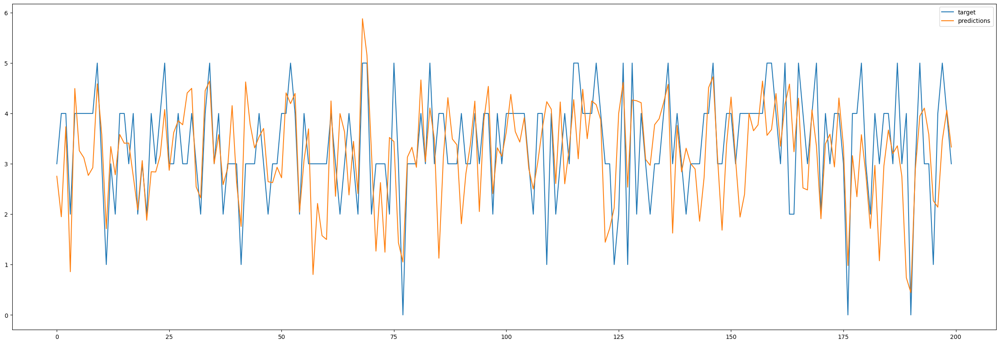

Epoch: 920, Loss: 2.5105, Train: 1.0182, Val: 1.1294, Test: 1.1164
Epoch: 930, Loss: 2.4795, Train: 1.0170, Val: 1.1350, Test: 1.1371


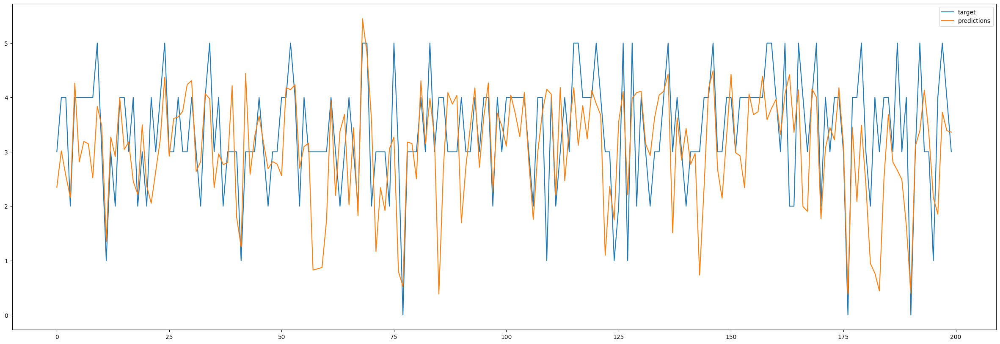

Epoch: 940, Loss: 2.4594, Train: 1.0689, Val: 1.1516, Test: 1.1400
Epoch: 950, Loss: 2.4674, Train: 1.0348, Val: 1.1475, Test: 1.1288


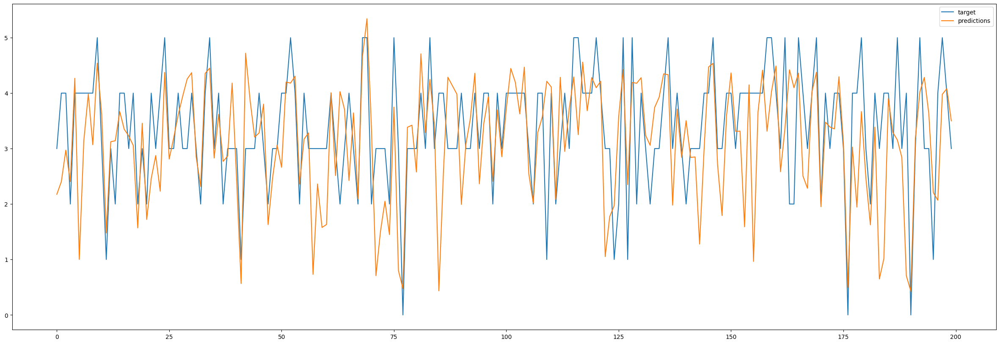

Epoch: 960, Loss: 2.4346, Train: 1.0591, Val: 1.1411, Test: 1.1359
Epoch: 970, Loss: 2.4580, Train: 1.0607, Val: 1.1805, Test: 1.1686


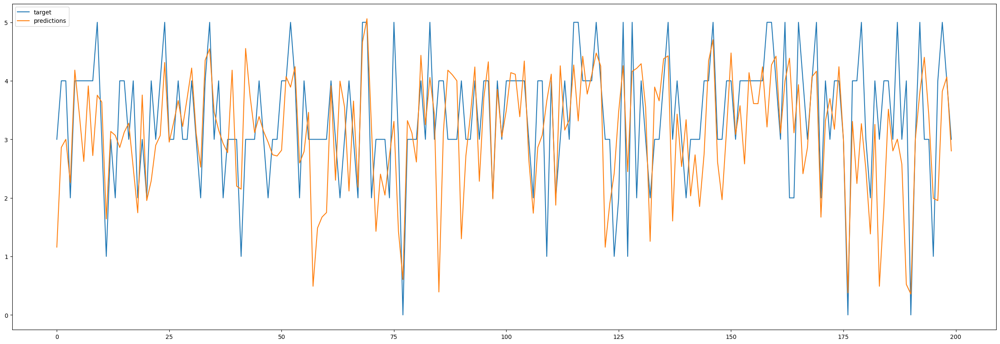

Epoch: 980, Loss: 2.4246, Train: 1.0508, Val: 1.1582, Test: 1.1514
Epoch: 990, Loss: 2.4355, Train: 1.0388, Val: 1.1446, Test: 1.1286


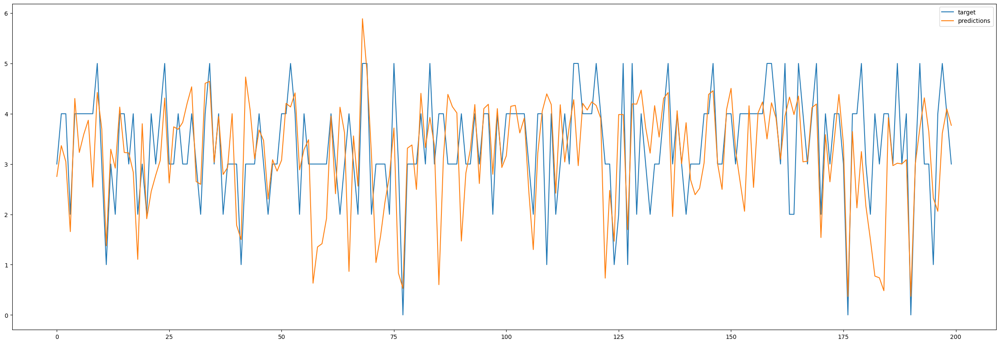

Epoch: 1000, Loss: 2.4500, Train: 1.0256, Val: 1.1305, Test: 1.1301


In [6]:
model = Model(
    data,
    layer_name="SAGE",
    encoder_num_layers=6,
    encoder_dropout=0.1,
    encoder_skip_connections=True,
    decoder_num_layers=8,
    hidden_channels=16,
    out_channels=16,
).to(device)
losses = train_test(
    model=model,
    epochs=1000,
    train_data=train_data,
    val_data=val_data,
    test_data=test_data,
    logging_step=10,
    lr=0.012,
)

#### Visualize

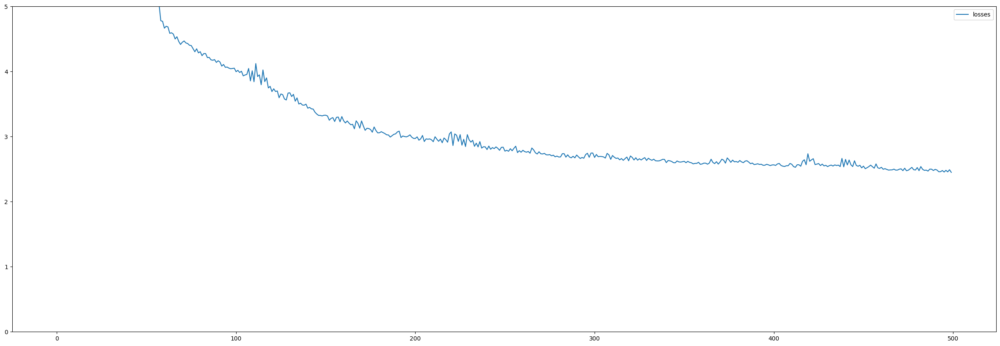

In [24]:
plot_loss({ "losses": losses }, ylim=5)